Add IC50 column to regression training dataset

In [1]:
import pandas as pd

# File paths for input files
file1 = "/Users/dolapo/Documents/ERDOS_bootcamp/git_clones/TRPM8-bootcamp-project/4_feature_selection/1_filter/train_reg.csv"  # Path to the first CSV file
file2 = "/Users/dolapo/Documents/ERDOS_bootcamp/git_clones/TRPM8-bootcamp-project/3_train_test_split/descriptors_all.csv"  # Path to the second CSV file

# Output file
output_file = "input/train_reg_filter_wIC50.csv"

# Read the CSV files into pandas DataFrames
df1 = pd.read_csv(file1)
df2 = pd.read_csv(file2)

# Ensure only Molecule ChEMBL ID and IC50 columns are used from file2
df2 = df2[["Molecule ChEMBL ID", "-logIC50"]]  # Adjust "IC50" to the actual column name in file2
#df2 = df2[["Molecule ChEMBL ID", "Potency"]]  # Adjust "IC50" to the actual column name in file2

# Merge the two files based on the "Molecule ChEMBL ID" column, keeping all rows in df1
merged_df = pd.merge(df1, df2, on="Molecule ChEMBL ID", how="left")  # Use "left" join to keep all rows from file1

# Save the merged DataFrame to a new CSV file
merged_df.to_csv(output_file, index=False)

print(f"Merged file saved to {output_file}")


Merged file saved to input/train_reg_filter_wIC50.csv


This script performs Principal Component Analysis (PCA) for dimensionality reduction and feature selection on the regression training data set of molecular descriptors. It also provides visualization and insights into the data structure. 

Dimensionality Reduction with PCA:
Applies PCA to reduce dimensions while retaining 95% of the variance.
Outputs a scree plot showing the variance explained by each principal component.
Select number of components based on the elblow of the scree plot (e.g. 15) 

PCA Loadings and Feature Selection:
Extracts PCA loadings and sorts them by absolute values.
Dynamically selects features using a threshold based on the mean and standard deviation of absolute loadings.
Saves sorted loadings and selected features to CSV files for training model

Also,converts the PCA-transformed data into a DataFrame and appends Molecule ChEMBL ID and Potency columns.
Saves the reduced-dimensional data to a CSV file (not used further in this project)

Visualizes the pairs of principal components colored by Potency categories (High, Medium, Low).


Explained Variance by Component: [0.26235127 0.132738   0.10081628 0.04944969 0.04165753 0.03187329
 0.02705406 0.02175969 0.01795751 0.01450908 0.01359369 0.01208654
 0.01065928 0.00990834 0.00891212]
Number of components selected: 15


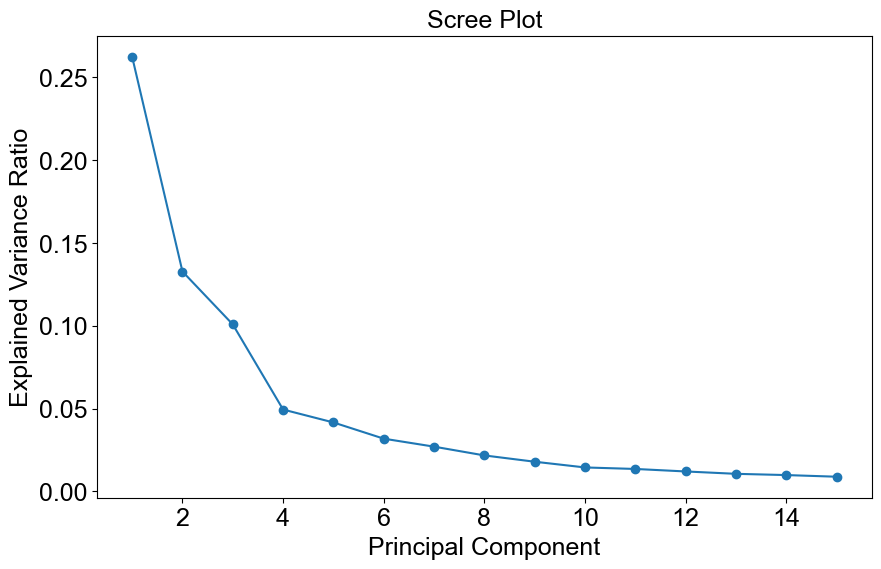

PCA Loadings:
                             PC1       PC2       PC3       PC4       PC5  \
PMI1                  -0.069117  0.002308 -0.036267 -0.027194 -0.016338   
PMI2                  -0.042752 -0.024373  0.098194  0.030113  0.006133   
Asphericity            0.031026 -0.026378  0.105563  0.014232 -0.017396   
Eccentricity           0.019860 -0.028031  0.092420  0.004740 -0.038276   
InertialShapeFactor    0.064328 -0.010696  0.031215 -0.008122 -0.033999   
...                         ...       ...       ...       ...       ...   
saturatedCarbocycles  -0.015578  0.045005  0.004794 -0.004426  0.021429   
saturatedHeterocycles  0.001464 -0.001328  0.041433  0.017923  0.064712   
satureatedRings       -0.011554  0.035169  0.029391  0.007517  0.057053   
ringCount             -0.057064  0.012711  0.007344  0.029201 -0.046705   
molLogP               -0.054363  0.017917 -0.027845 -0.033350  0.033993   

                            PC6       PC7       PC8       PC9      PC10  \
PMI1     

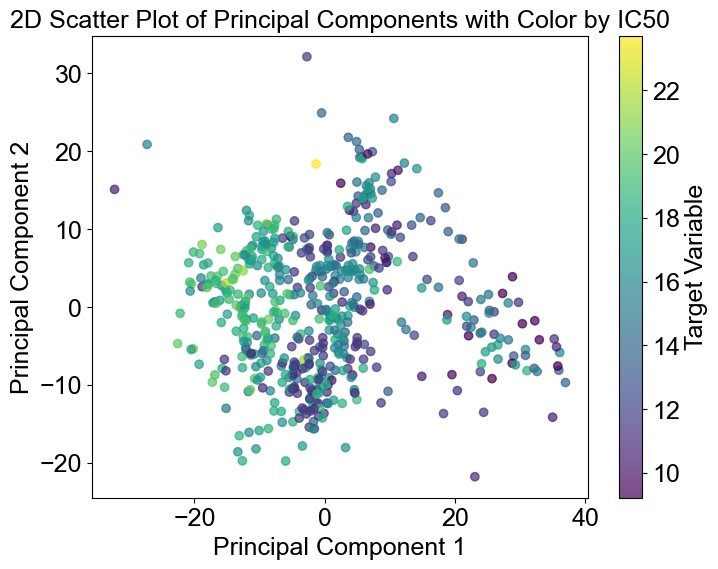

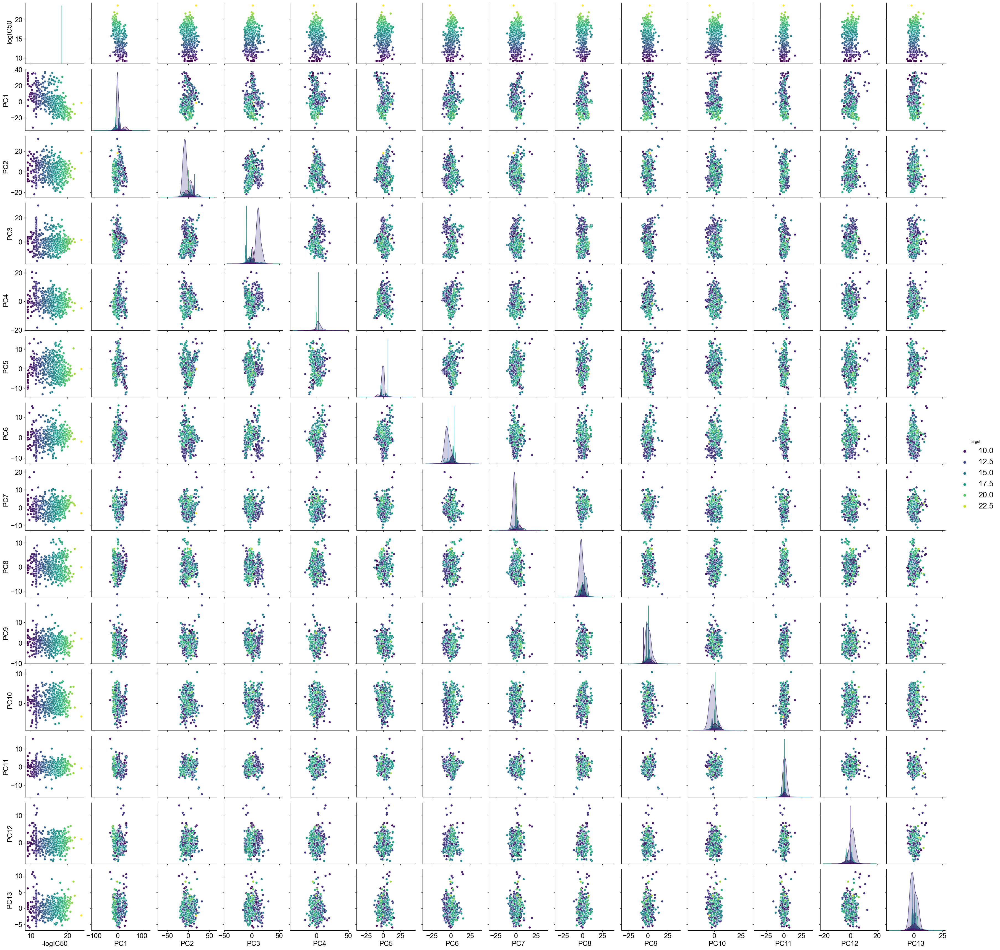

In [3]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure global font settings to Arial
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'
rcParams['axes.titlesize'] = 18  # Font size for titles
rcParams['axes.labelsize'] = 18  # Font size for axis labels
rcParams['xtick.labelsize'] = 18  # Font size for tick labels
rcParams['ytick.labelsize'] = 18  # Font size for tick labels
rcParams['legend.fontsize'] = 20  # Adjust legend font size

# 1. Load data
data = pd.read_csv("input/train_reg_filter_wIC50.csv")

# Separate features and target variable if applicable
X = data.drop(columns=['Molecule ChEMBL ID', '-logIC50'])  # Replace '-logIC50' with your target variable if needed
y = data['-logIC50']  # Target variable

# 2. Standardize the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 3. Apply PCA to reduce dimensions, keep components that explain 95% of the variance
pcs = PCA(n_components=15)  # Adjust n_components based on your scree plot analysis
X_pcs = pcs.fit_transform(X_scaled)

# 4. Check the variance explained by each component
explained_variance = pcs.explained_variance_ratio_
print("Explained Variance by Component:", explained_variance)
print("Number of components selected:", pcs.n_components_)

# 5. Visualize the explained variance (Scree Plot)
PCA_Scree_plot = '15PCS_scree_plot.png'
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o')
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Scree Plot")
plt.savefig(PCA_Scree_plot, format='png', dpi=300)
plt.show()

# 6. Inspect PCA Loadings
loadings = pd.DataFrame(pcs.components_.T, index=X.columns, columns=[f'PC{i+1}' for i in range(pcs.n_components_)])
print("PCA Loadings:\n", loadings)

# 7. Sort by absolute sums of loadings and compute mean + 1 std threshold
abs_sum_loadings = loadings.abs().sum(axis=1)  # Compute absolute sums of loadings for each feature
mean_loading = abs_sum_loadings.mean()
std_loading = abs_sum_loadings.std()
threshold = mean_loading + std_loading
print(f"Dynamic threshold (mean + 1 std): {threshold}")

# Select features based on the threshold
selected_features = abs_sum_loadings[abs_sum_loadings > threshold].index.tolist()
print(f"Number of features selected with threshold {threshold}: {len(selected_features)}")

# Save sorted absolute sums and selected features
abs_sum_loadings.sort_values(ascending=False).to_csv("PCA_sorted_abs_sum_loadings.csv", header=True)
selected_columns = ['Molecule ChEMBL ID', '-logIC50'] + selected_features
train_pca_reduced_reg = data[selected_columns]
train_pca_reduced_reg.to_csv("train_pca_reduced_reg.csv", index=False)
print("Selected features saved to 'selected_features_based_on_absolute_sum.csv'.")

# 8. Convert the PCA-transformed data to a DataFrame
X_pcs_df = pd.DataFrame(X_pcs, columns=[f'PC{i+1}' for i in range(pcs.n_components_)])
X_pcs_df.insert(0, 'Molecule ChEMBL ID', data['Molecule ChEMBL ID'])
X_pcs_df.insert(1, '-logIC50', data['-logIC50'])

# Save the PCA-transformed data
X_pcs_df.to_csv("transformed_reduced_dim_data_with_pcs.csv", index=False)
print("PCA-transformed data with 'Molecule ChEMBL ID' and '-logIC50' saved to 'transformed_reduced_dim_data_with_pcs.csv'.")


# 11. PCA Scatter Plot by Target Variable
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_pcs_df['PC1'], X_pcs_df['PC2'], c=y, cmap='viridis', alpha=0.7)
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.title("2D Scatter Plot of Principal Components with Color by IC50")
plt.colorbar(scatter, label="Target Variable")
plt.savefig('Reg_feature_sel_PC1_PC2.png', format='png', dpi=300)
plt.show()

# 12. Pair Plot of Top Principal Components
pca_top_components = X_pcs_df.iloc[:, :15]
pca_top_components['Target'] = y

pair_plot = sns.pairplot(pca_top_components, hue='Target', palette='viridis', diag_kind='kde')
pair_plot.fig.savefig("Reg_all_15PCs_combinations.png", format='png', dpi=300)
plt.show()




In [ ]:
X = selected_features_df.drop(columns=['Molecule ChEMBL ID', '-logIC50'])  # Drop ID and target columns
y_regression = selected_features_df['-logIC50']  # Regression target


In [30]:
from sklearn.model_selection import train_test_split

# Use the PCA-transformed data or the selected features
#X = X_pcs_df.drop(columns=['Molecule ChEMBL ID', '-logIC50'])
#y = X_pcs_df['-logIC50']

# Use the PCA selected features data
X = selected_features_df.drop(columns=['Molecule ChEMBL ID', '-logIC50'])
y = selected_features_df['-logIC50']

# Split data into training and testing sets (e.g., 80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

XGBoost RMSE: 2.2758547121585564
Baseline RMSE (Mean Prediction): 3.1173


<Figure size 1000x800 with 0 Axes>

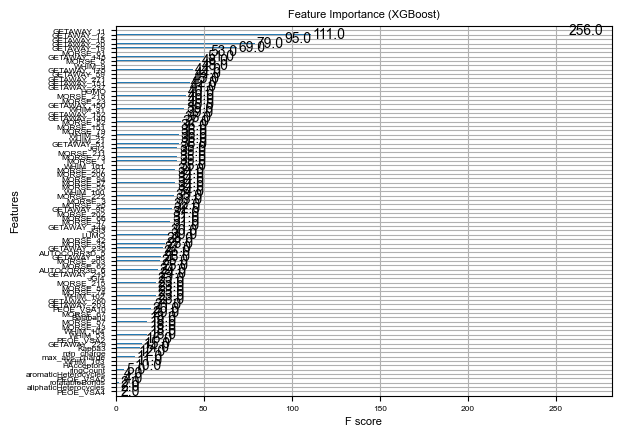

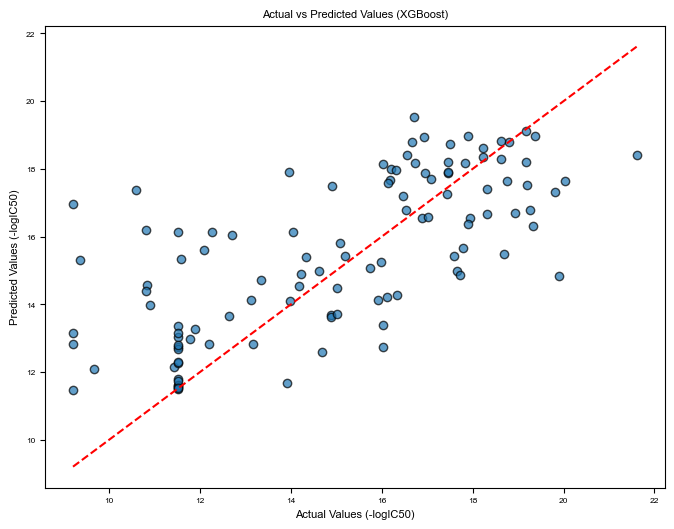

In [31]:
#XGBOOST
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from xgboost import plot_importance


# Ensure global font settings to Arial
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'
rcParams['axes.titlesize'] = 8  # Font size for titles
rcParams['axes.labelsize'] = 8  # Font size for axis labels
rcParams['xtick.labelsize'] = 6  # Font size for tick labels
rcParams['ytick.labelsize'] = 6  # Font size for tick labels
rcParams['legend.fontsize'] = 6  # Adjust legend font size

# Initialize and train the XGBoost model
xgb_model = XGBRegressor(random_state=42)
xgb_model.fit(X_train, y_train)

# Make predictions
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate the model
xgb_rmse = mean_squared_error(y_test, y_pred_xgb, squared=False)
print(f"XGBoost RMSE: {xgb_rmse}")

baseline_rmse = np.sqrt(mean_squared_error(y_test, [y_train.mean()] * len(y_test)))
print(f"Baseline RMSE (Mean Prediction): {baseline_rmse:.4f}")


# Plot feature importance
plt.figure(figsize=(10, 8))
plot_importance(xgb_model, importance_type='weight')  # Options: 'weight', 'gain', 'cover'
plt.title("Feature Importance (XGBoost)")
plt.show()

import matplotlib.pyplot as plt

# Scatter plot of actual vs predicted values
plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_xgb, alpha=0.7, edgecolors='k')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], color='red', linestyle='--')  # Perfect prediction line
plt.xlabel("Actual Values (-logIC50)")
plt.ylabel("Predicted Values (-logIC50)")
plt.title("Actual vs Predicted Values (XGBoost)")
plt.show()

In [ ]:
#factor analysis; uses abolute sum for selection

Explained Variance by Factor: [0.06758926 0.06753989 0.06751428 0.06743376 0.06729005 0.06717164
 0.06703684 0.06696308 0.06668604 0.06659785 0.06626574 0.0659525
 0.06561158 0.06542425 0.06492322]
Number of factors selected: 15
Factor Loadings:
                         Factor1   Factor2   Factor3   Factor4   Factor5  \
PMI1                  -0.811576  0.051346 -0.162880 -0.300547 -0.172673   
PMI2                  -0.513339  0.028763  0.723104  0.216529 -0.038635   
Asphericity            0.386170 -0.083919  0.748175  0.323384 -0.052091   
Eccentricity           0.255299 -0.098267  0.687507  0.244370 -0.108978   
InertialShapeFactor    0.798706 -0.132550  0.218930  0.129869 -0.055984   
...                         ...       ...       ...       ...       ...   
saturatedCarbocycles  -0.137744  0.392063 -0.023606 -0.076835  0.069743   
saturatedHeterocycles  0.011876  0.028091  0.248514  0.263408  0.111131   
satureatedRings       -0.102822  0.330842  0.134419  0.101041  0.124321   
rin

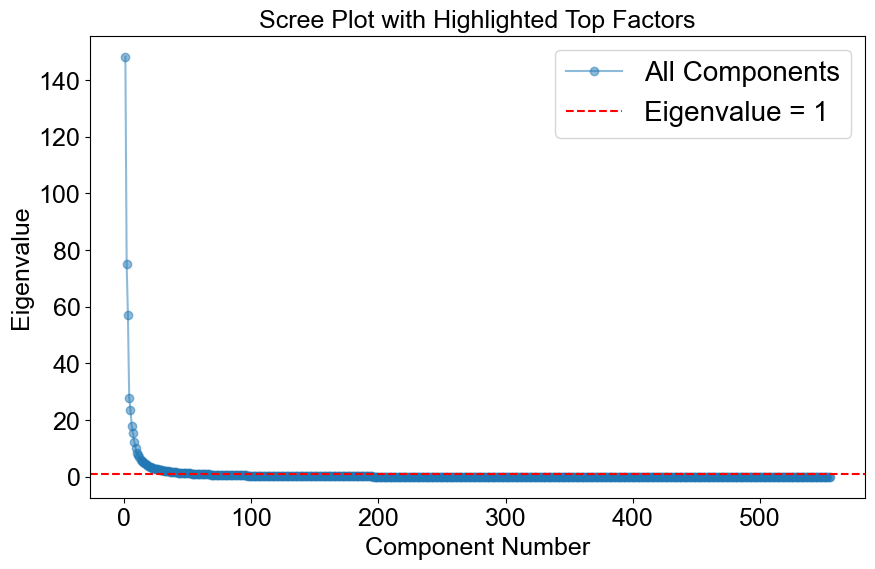

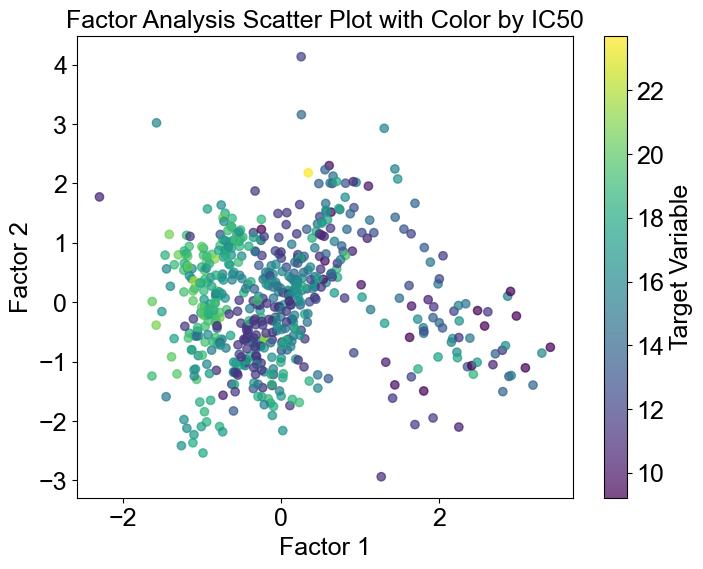

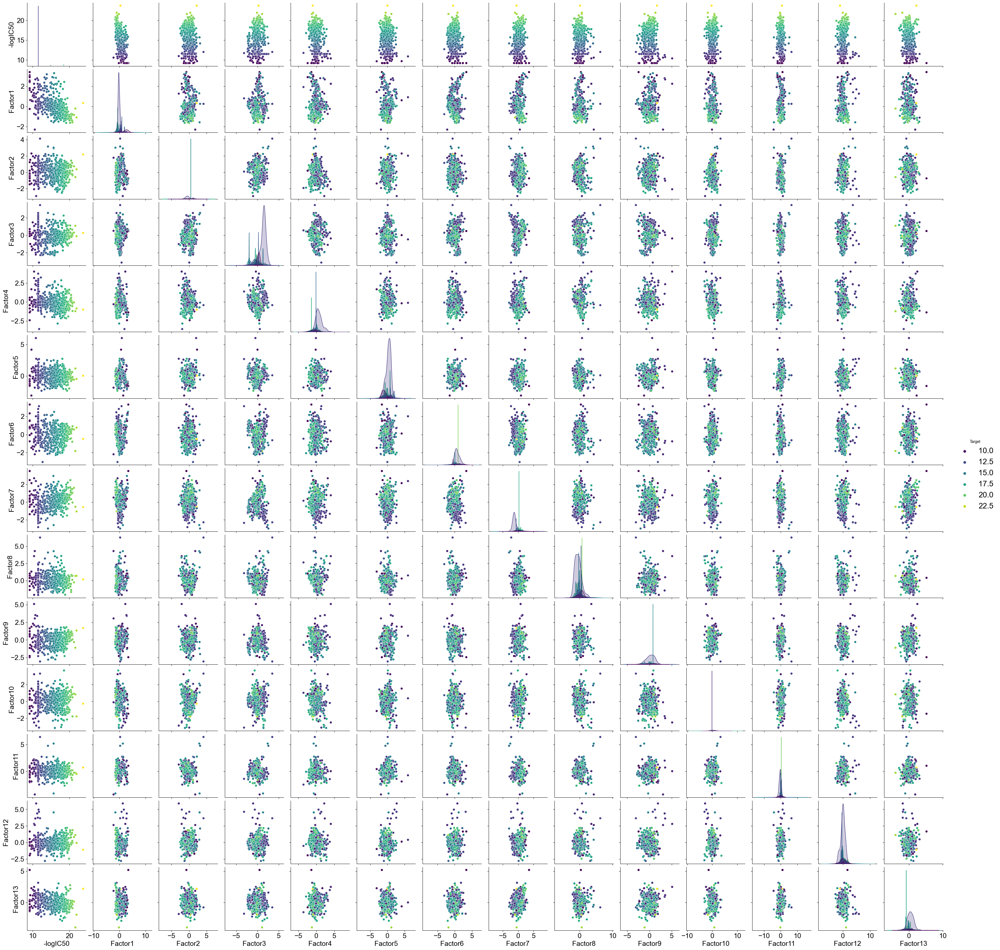

In [24]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import FactorAnalysis
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Ensure global font settings to Arial
from matplotlib import rcParams
rcParams['font.family'] = 'Arial'
rcParams['axes.titlesize'] = 18  # Font size for titles
rcParams['axes.labelsize'] = 18  # Font size for axis labels
rcParams['xtick.labelsize'] = 18  # Font size for tick labels
rcParams['ytick.labelsize'] = 18  # Font size for tick labels
rcParams['legend.fontsize'] = 20  # Adjust legend font size

# 1. Load data
data = pd.read_csv("train_reg_filter_wIC50.csv")

# Separate features and target variable
X = data.drop(columns=['Molecule ChEMBL ID', '-logIC50'])  # Replace '-logIC50' with your target variable if needed
y = data['-logIC50']  # Target variable

# 2. Standardize the feature data
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)


# 3. Apply Factor Analysis
num_factors = 15  # Set the number of factors based on scree plot or domain knowledge
fa = FactorAnalysis(n_components=num_factors, random_state=42)
X_factors = fa.fit_transform(X_scaled)

# 4. Approximate Explained Variance (since FA doesn't directly provide it)
explained_variance = np.var(X_factors, axis=0) / np.sum(np.var(X_factors, axis=0))
print("Explained Variance by Factor:", explained_variance)
print(f"Number of factors selected: {num_factors}")

# 5. Inspect Factor Loadings
factor_loadings = pd.DataFrame(fa.components_.T, index=X.columns, columns=[f'Factor{i+1}' for i in range(num_factors)])
print("Factor Loadings:\n", factor_loadings)

# 6. Dynamic Thresholding for Feature Selection
# Compute the absolute sum of loadings for each feature across all factors
abs_sum_loadings = factor_loadings.abs().sum(axis=1)

# Compute mean and standard deviation
mean_loading = abs_sum_loadings.mean()
std_loading = abs_sum_loadings.std()

# Define threshold: mean + 1.5 std
threshold = mean_loading + 1 * std_loading
print(f"Dynamic threshold (mean + 1 std): {threshold}")

# Select features based on the threshold
selected_features = abs_sum_loadings[abs_sum_loadings > threshold].index.tolist()
print(f"Number of features selected with threshold {threshold}: {len(selected_features)}")

# Save sorted absolute sums and selected features
#abs_sum_loadings.sort_values(ascending=False).to_csv("FA_sorted_abs_sum_loadings.csv", header=True)
selected_columns = ['Molecule ChEMBL ID', '-logIC50'] + selected_features
selected_features_df = data[selected_columns]
#selected_features_df.to_csv("FA_reg_selected_features_based_on_absolute_sum.csv", index=False)
#print("Selected features saved to 'FA_reg_selected_features_based_on_absolute_sum.csv'.")

# 7. Save Transformed Factor Data
X_factors_df = pd.DataFrame(X_factors, columns=[f'Factor{i+1}' for i in range(num_factors)])
X_factors_df.insert(0, 'Molecule ChEMBL ID', data['Molecule ChEMBL ID'])
X_factors_df.insert(1, '-logIC50', data['-logIC50'])

X_factors_df.to_csv("FA_transformed_reduced_dim_data.csv", index=False)
print("Factor Analysis-transformed data saved to 'FA_transformed_reduced_dim_data.csv'.")

# 8. Scree Plot of Eigenvalues (using PCA as proxy)
from sklearn.decomposition import PCA
pca = PCA().fit(X_scaled)
eigenvalues = pca.explained_variance_

plt.figure(figsize=(10, 6))
plt.plot(range(1, len(eigenvalues) + 1), eigenvalues, marker='o', label="All Components", alpha=0.5)
plt.axhline(y=1, color='red', linestyle='--', label="Eigenvalue = 1")
plt.xlabel("Component Number")
plt.ylabel("Eigenvalue")
plt.title("Scree Plot with Highlighted Top Factors")
plt.legend()
#plt.savefig("FA_Scree_plot.png", format='png', dpi=300)
#plt.show()

# 10. Factor Scatter Plot by Target Variable
plt.figure(figsize=(8, 6))
scatter = plt.scatter(X_factors_df['Factor1'], X_factors_df['Factor2'], c=y, cmap='viridis', alpha=0.7)
plt.xlabel("Factor 1")
plt.ylabel("Factor 2")
plt.title("Factor Analysis Scatter Plot with Color by IC50")
plt.colorbar(scatter, label="Target Variable")
#plt.savefig('FA_scatter_plot.svg', format='svg', dpi=300)
#plt.show()

# 11. Pair Plot of Top Factors
factor_top_components = X_factors_df.iloc[:, :15]
factor_top_components['Target'] = y

pair_plot = sns.pairplot(factor_top_components, hue='Target', palette='viridis', diag_kind='kde')
#pair_plot.fig.savefig("FA_all_15Factors_combinations.svg", format='svg', dpi=300)
#plt.show()
